$\phantom{\setcounter{secnumdepth}{0}}$

# DTSA 5511 Final Project
#### Introduction to Deep Learning

####  
####  

# Computer Vision in Autonomous Driving

## Description of the problem

For my final project, I chose the famous KITTI dataset (https://www.cvlibs.net/datasets/kitti/), namely the part of it that includes photos from cameras of autonomous cars.

![header](imgs/header.png)

We covered binary and multi-class classification in our courses, but when I saw this dataset, I became curious about how to do this, because:
- an image can contain many objects of the same class, and neither binary nor multi-class classification is suitable for this;
- we need to not only predict with certainty the presence of an object in the image, but also find its exact position and boundaries.

When I first thought about this, I realized I had absolutely no idea how to do it. And this is a very common task, because besides autonomous machines, a similar computer vision approach can be applied, for example, in robotics, agriculture, medicine, welding, or even simply finding faces in photographs.

![examples](imgs/examples.jpeg)

My final project goal **wasn't to use a ready-made model** and achieve the best prediction, but to **understand how to do it** using only **standard Keras and Tensorflow** tools, even if my model's predictions were worse than those of ready-made models. It's important to understand the underlying principles, the appropriate model architecture for this task, its outputs, activation functions, loss calculation, and so on.

**My model should:**
- find objects in an image and return a probability for each one.
- find the boundaries of each detected object and return their coordinates.

After I create my model, train it, and get satisfactory results, I'll compare its performance with one of the existing ready-made object detection models, like YOLO.

## Brief description of the data

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import glob
import math
import time
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

import cv2
import keras_cv
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report, precision_score, recall_score, f1_score, matthews_corrcoef

image_files = sorted(glob.glob('training/image_2/*.png'))
label_files = sorted(glob.glob('training/label_2/*.txt'))

print(len(image_files), len(label_files))

image = Image.open(image_files[0])
print(image.mode, image.size)

Using TensorFlow backend
7481 7481
RGB (1224, 370)


The dataset consists of two folders containing files. One folder contains 7,481 RGB image files measuring 1224 by 370 pixels, while the other contains 7,481 files with labels and object coordinates.

Since the labels and coordinates are stored in separate files for each image, rather than in the familiar .csv format, I'll need to create a simple function to read the file and convert it to a pandas dataframe. This will make it easier to conduct Exploratory Data Analysis on the objects in the images.

In [2]:
def parse_label_file(file):
    rows = []
    with open(file) as f:
        for line in f:
            parts = line.split()
            rows.append({
                'image_id': file.split('/')[-1][:-4],
                'type': parts[0],
                'truncation': float(parts[1]),
                'occlusion': int(parts[2]),
                'alpha': float(parts[3]),
                'xmin': float(parts[4]),
                'ymin': float(parts[5]),
                'xmax': float(parts[6]),
                'ymax': float(parts[7])
            })
        return rows

all_rows = []
for f in label_files:
    all_rows.extend(parse_label_file(f))
df = pd.DataFrame(all_rows)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51865 entries, 0 to 51864
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_id    51865 non-null  object 
 1   type        51865 non-null  object 
 2   truncation  51865 non-null  float64
 3   occlusion   51865 non-null  int64  
 4   alpha       51865 non-null  float64
 5   xmin        51865 non-null  float64
 6   ymin        51865 non-null  float64
 7   xmax        51865 non-null  float64
 8   ymax        51865 non-null  float64
dtypes: float64(6), int64(1), object(2)
memory usage: 3.6+ MB


In [3]:
df.head()

,image_id,type,truncation,occlusion,alpha,xmin,ymin,xmax,ymax
0,000000,Pedestrian,0.0,0,-0.20,712.40,143.00,810.73,307.92
1,000001,Truck,0.0,0,-1.57,599.41,156.40,629.75,189.25
2,000001,Car,0.0,0,1.85,387.63,181.54,423.81,203.12
3,000001,Cyclist,0.0,3,-1.65,676.60,163.95,688.98,193.93
4,000001,DontCare,-1.0,-1,-10.00,503.89,169.71,590.61,190.13


In [4]:
print('types:     ', ', '.join(df['type'].unique()))

print('duplicated:', sum(df[['image_id','type','xmin','ymin','xmax','ymax']].duplicated()))

types:      Pedestrian, Truck, Car, Cyclist, DontCare, Misc, Van, Tram, Person_sitting
duplicated: 0


I ended up with a dataset of 51,865 entries (remember, there were almost ten times fewer files (and images)), each entry has 9 features:
- image_id — ID of the image to which the object belongs
- type — object type; there are nine different types in total
- truncation — how much the object is cut off by the edge of the frame
- occlusion — how much the object is obscured by another object
- alpha — object direction (front relative to the camera, sideways, etc.)
- xmin, ymin, xmax, and ymax — coordinates of the object's boundaries

The dataset does not contain missing values ​​or duplicates.

In [5]:
# Add some features

df['width'] = df['xmax'] - df['xmin']
df['height'] = df['ymax'] - df['ymin']
df['area'] = df['width'] * df['height']
df['aspect_ratio'] = df['width'] / df['height']

# Exploratory Data Analysis (EDA)

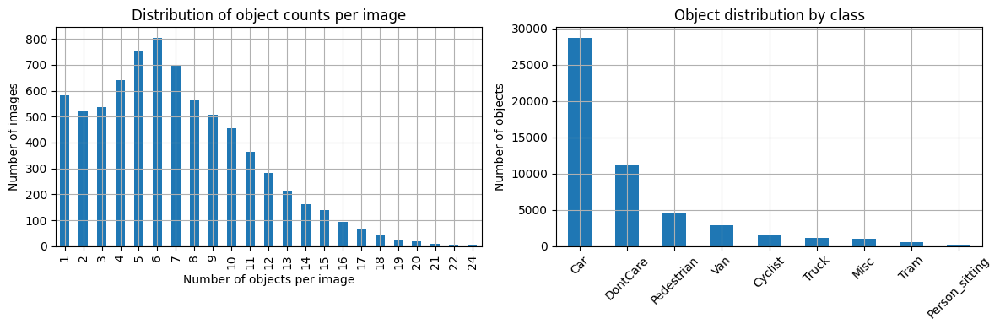

Mean of objects per image: 6.932896671567972


In [6]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

# Left plot: objects per image
df.groupby('image_id')['type'].count().value_counts().sort_index().plot(kind='bar', ax=ax[0])
ax[0].set_xlabel('Number of objects per image')
ax[0].set_ylabel('Number of images')
ax[0].set_title('Distribution of object counts per image')
ax[0].grid(True)

# Right plot: class distribution
df['type'].value_counts().plot(kind='bar', ax=ax[1])
ax[1].set_xlabel('')
ax[1].set_ylabel('Number of objects')
ax[1].set_title('Object distribution by class')
ax[1].tick_params(axis='x', rotation=45)
ax[1].grid(True)

plt.tight_layout()
plt.show()

print('Mean of objects per image:', df.groupby('image_id')['type'].count().mean())

The graphs show that each image contains at least one object, with an average of seven objects per image. The most common objects are *Car*, followed by *DontCare*, which, judging by its name, isn't the most interesting to me, while the others are significantly fewer.

Next, I'll analyze the objects' bounding boxes, starting with their sizes and areas.

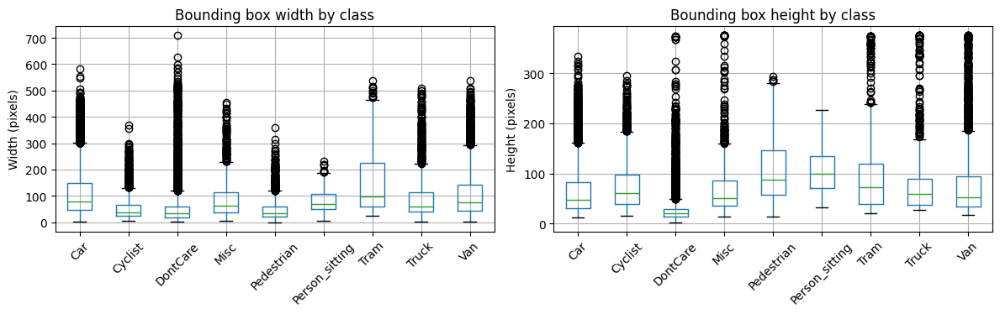

In [7]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

df.boxplot(column='width', by='type', ax=ax[0])
ax[0].tick_params(axis='x', rotation=45)
ax[0].set_title('Bounding box width by class')
ax[0].set_xlabel('')
ax[0].set_ylabel('Width (pixels)')

df.boxplot(column='height', by='type', ax=ax[1])
ax[1].tick_params(axis='x', rotation=45)
ax[1].set_title('Bounding box height by class')
ax[1].set_xlabel('')
ax[1].set_ylabel('Height (pixels)')

plt.suptitle('')
plt.tight_layout()
plt.show()

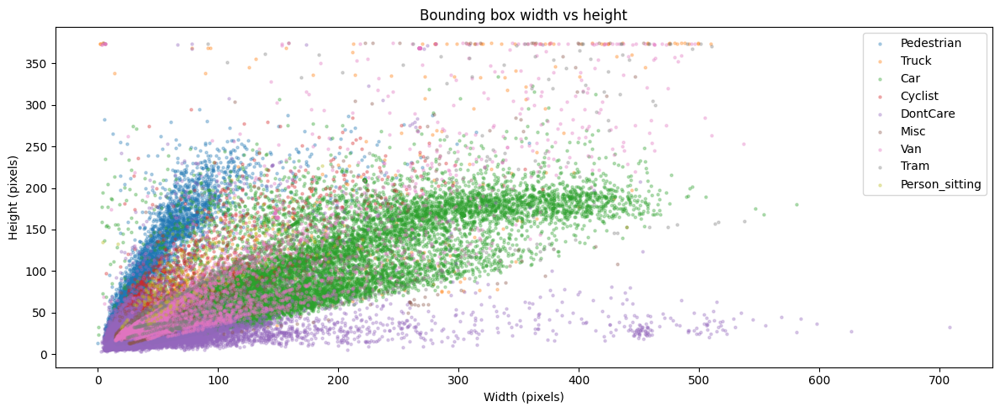

In [8]:
# scatter width vs height
plt.figure(figsize=(12, 5))
for i, t in enumerate(df['type'].unique()):
    mask = df['type'] == t
    plt.scatter(df['width'][mask], df['height'][mask], s=5, alpha=0.3, label=t)
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.title('Bounding box width vs height')
plt.legend()

plt.tight_layout()
plt.show()

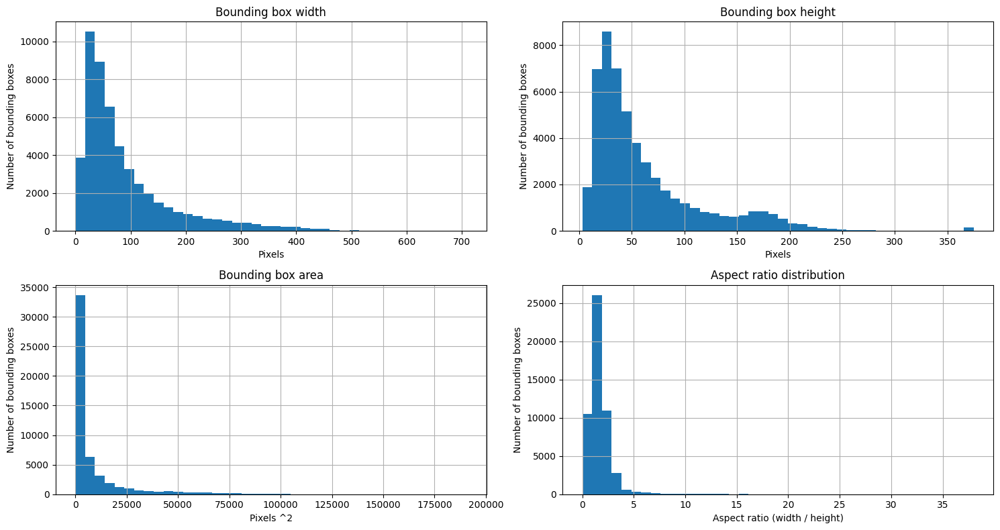

In [9]:
fig, ax = plt.subplots(2, 2, figsize=(15, 8))

ax[0,0].hist(df['width'], bins=40)
ax[0,0].set_title('Bounding box width')
ax[0,0].set_xlabel('Pixels')
ax[0,0].set_ylabel('Number of bounding boxes')
ax[0,0].grid(True)

ax[0,1].hist(df['height'], bins=40)
ax[0,1].set_title('Bounding box height')
ax[0,1].set_ylabel('Number of bounding boxes')
ax[0,1].set_xlabel('Pixels')
ax[0,1].grid(True)

ax[1,0].hist(df['area'], bins=40)
ax[1,0].set_title('Bounding box area')
ax[1,0].set_ylabel('Number of bounding boxes')
ax[1,0].set_xlabel('Pixels ^2')
ax[1,0].grid(True)

ax[1,1].hist(df['aspect_ratio'], bins=40)
ax[1,1].set_title('Aspect ratio distribution')
ax[1,1].set_ylabel('Number of bounding boxes')
ax[1,1].set_xlabel('Aspect ratio (width / height)')
ax[1,1].grid(True)

plt.tight_layout()
plt.show()

You can see a fairly large variation in both the height/width of the bounding boxes and the aspect ratio. The size variation is clear: if an object is close, it appears larger than if it's far away. The aspect ratio variation is most likely due to the objects being too different: the trum is a horizontal, elongated rectangle from the side, while the pedestrian is vertical.

# Focus on a single class (Car)

To simplify the model, and especially the loss function (it will have to calculate the error not only in class prediction for several objects in the image but also in the coordinates of these objects), I decided to leave only one class, **Car**. This is especially true since it accounts for the vast majority of objects in the images. In this case, the loss function will only need to calculate the binary classification error for objects and their coordinate prediction.

I'll filter out objects of the **Car** class and check for images that lack this class.

In [10]:
df_cars = df[df['type']=='Car'].copy()

print('Number of images without cars:', len(image_files) - len(df_cars['image_id'].unique()))

Number of images without cars: 797


Now there's only one class left, but 797 images don't contain a single object of that class. I could probably keep them, but the original dataset didn't include empty images that didn't contain a single object of any class. I don't want to change this condition, so I'll exclude these images from the dataset. More precisely, I'll recreate a list of image files containing only those that contain the required class.

In [11]:
image_files = sorted([f"training/image_2/{id}.png" for id in df_cars['image_id'].unique()])
label_files = sorted([f"training/label_2/{id}.txt" for id in df_cars['image_id'].unique()])
print(len(image_files), len(label_files))

6684 6684


In [12]:
# add feature 'distance'

q1 = df_cars['area'].quantile(0.33)
q2 = df_cars['area'].quantile(0.66)

def dist_group(a):
    if a < q1: return 'far'
    if a < q2: return 'mid'
    return 'near'

df_cars['distance'] = df_cars['area'].apply(dist_group)

I added another feature, *distance*, based on the area of ​​an object's bounding box. Since the dataset only contains *Car* objects, we can assume they are roughly comparable in size (not exactly, but this feature is only for exploratory data analysis and is not used in model training). The smaller the area of ​​an object, the further away it is, and conversely, the larger it is, the closer it is.

# Single-Class Exploratory Data Analysis (Car)

Now, since the dataset has changed significantly, especially in the sizes and aspect ratios of objects, I will run **Exploratory Data Analysis** again, but this time only for one class.

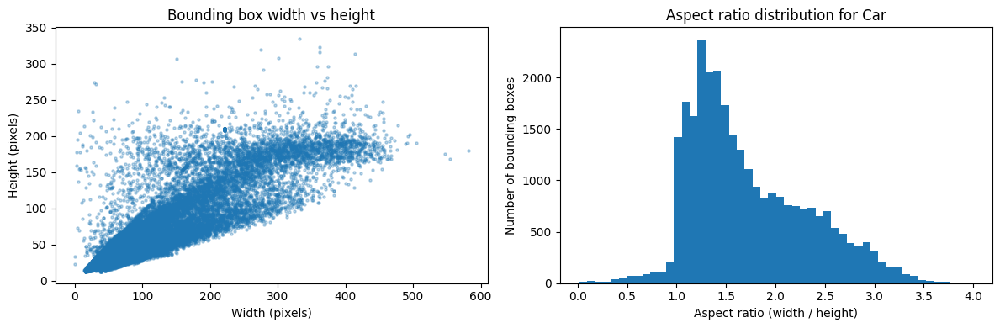

In [13]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].scatter(df_cars['width'], df_cars['height'], s=5, alpha=0.3)
ax[0].set_xlabel('Width (pixels)')
ax[0].set_ylabel('Height (pixels)')
ax[0].set_title('Bounding box width vs height')

ax[1].hist(df_cars['aspect_ratio'], bins=50)
ax[1].set_title('Aspect ratio distribution for Car')
ax[1].set_xlabel('Aspect ratio (width / height)')
ax[1].set_ylabel('Number of bounding boxes')

plt.tight_layout()
plt.show()

As you can see, the range of bounding box sizes, and especially their aspect ratio, has noticeably decreased, which is better for model training. When creating the *df_cars* dataset, I added the *distance* feature, and now you can see the distribution of objects in the image based on their distance. It's a kind of hitmap of objects in the image.

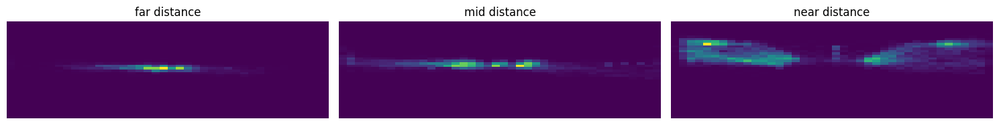

In [14]:
groups = ['far','mid','near']
fig, axes = plt.subplots(1, 3, figsize=(15,4))

for ax, group in zip(axes,groups):
    d = df_cars[df_cars['distance'] == group]
    heat,x,y = np.histogram2d(d['xmin']+d['width']/2, d['ymin']+d['height']/2,
                              bins=[40, 40], range=[[0, 1224], [0, 370]])
    ax.imshow(heat.T, origin='lower', extent=[0, 1224, 0, 370])
    ax.set_title(f'{group} distance')
    ax.axis('off')

plt.tight_layout()
plt.show()

The hitmaps show that distant objects (small-area objects) are predominantly located in the center of the image, while nearby objects (large-area objects) are located closer to the edges. Most likely, most of the images are straight sections of road, not intersections, where nearby objects are cars in adjacent lanes, and distant objects are cars far ahead.

Interestingly, at close range, it appears as if there are more objects on the left than on the right. Let's check.

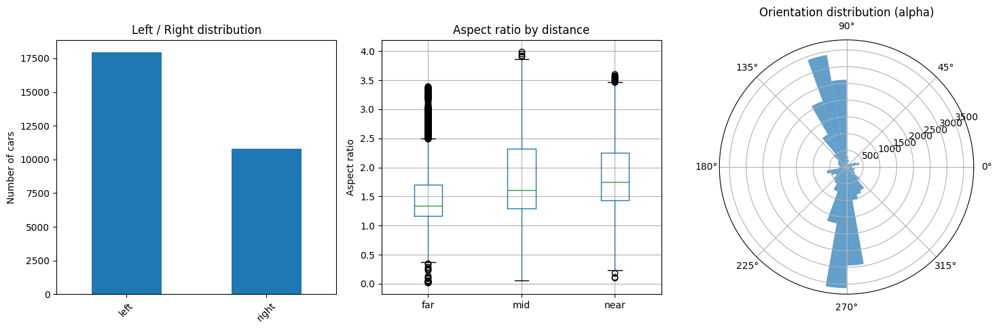

In [15]:
# I cannot use the usual plt.subplots() here
# because the polar plot is not compatible with this layout.

fig = plt.figure(figsize=(15,5))
gs = fig.add_gridspec(1, 3)

position = (df_cars['xmin'] + df_cars['width'] / 2).apply(lambda x: 'left' if x < 612 else 'right')
ax0 = fig.add_subplot(gs[0,0])
position.value_counts().plot(kind='bar', ax=ax0)
ax0.tick_params(axis='x', rotation=45)
ax0.set_ylabel('Number of cars')
ax0.set_title('Left / Right distribution')
ax0.set_xlabel('')

ax1 = fig.add_subplot(gs[0,1])
df_cars.boxplot(column='aspect_ratio', by='distance', ax=ax1)
ax1.set_title('Aspect ratio by distance')
ax1.set_ylabel('Aspect ratio')
ax1.set_xlabel('')

ax2 = fig.add_subplot(gs[0,2], polar=True)
ax2.hist(df_cars['alpha'].values, bins=36, alpha=0.7) # polar histogram
ax2.set_title('Orientation distribution (alpha)')

plt.suptitle('')
plt.tight_layout()
plt.show()

Indeed, there are more objects on the left side of the image than on the right. This is most likely due to the oncoming traffic lane, meaning even if we're driving in the far left lane, there will still be cars on the left.

The median aspect ratio of the bounding boxes doesn't change much at different distances, but their spread does.

The polar plot of the objects' orientation relative to the camera shows that we see most cars from the front or back, but not directly, but slightly to the side, as the cars are in different lanes. This further confirms that most of the images are straight sections of road without intersections.

It's probably time to look at the images themselves and their bounding boxes.

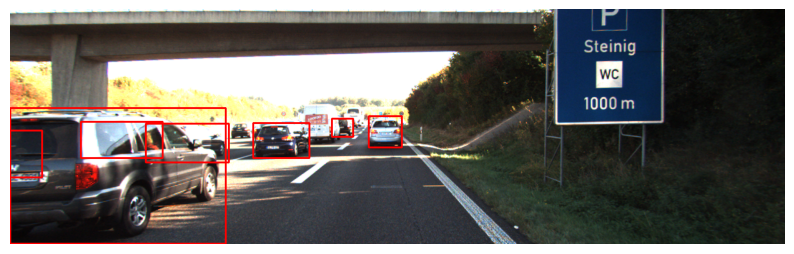

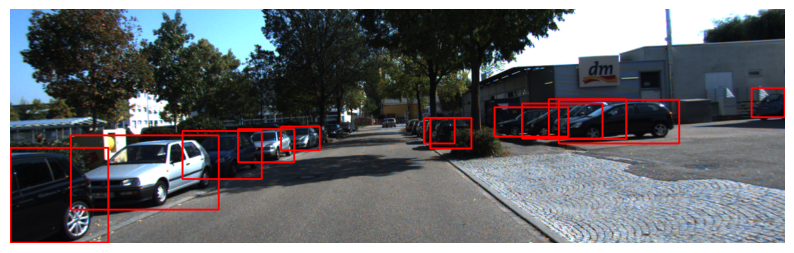

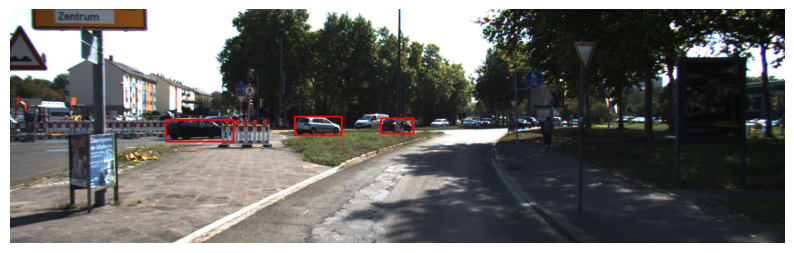

In [16]:
np.random.seed(19)
for id in np.random.choice(df_cars['image_id'].unique(), size=3, replace=False):
    img = cv2.imread(f"training/image_2/{id}.png")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for _, row in df_cars[df_cars['image_id'] == id].iterrows():
        cv2.rectangle(img, (int(row.xmin), int(row.ymin)), (int(row.xmax), int(row.ymax)), (255, 0, 0), 2)
    plt.figure(figsize=(10, 4))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

##
# Plan of Model architecture and learning based on EDA

After EDA, I already have a pretty good idea of ​​what the images and objects in them are. Now the fun begins. I need to decide on the model architecture and how to prepare the training data. Speaking of data, we usually have training data (in this project, the image itself) and a target the model needs to learn to predict. But what is the target in this case?

I borrowed the idea from the popular YOLO object detection model. Or rather, a greatly simplified idea, but one that should nonetheless help solve the problem.

**Concept (a highly simplified YOLO example):**
- the entire image is divided into small segments (grid cells)
- a segment may contain the center of an object's bounding box (the model predicts the probability of this)
- for each object's bounding box, the model predicts the exact position of its center relative to the segment and the size of the bounding box

In other words, I divide the image into N x M small segments (a grid), and each segment contains a vector of five values: the probability of the box center, the coordinates of the box center relative to the segment, and the box size. The resulting **three-dimensional matrix** (tensor) is **N x M x 5** in size, and this will be **the target the model must predict**.

The images in the dataset are 1224 x 370 pixels in size, and the most suitable cell (segment) size is **32 x 32 pixels**. Therefore, I need to resize the images to **1248 x 384 pixels** to obtain a grid of **39 x 12 cells** of 32 pixels each.

The model will consist of seven convolutional layers and five max pooling layers, which will transform a 1248 x 384 x 3 image into a 39 x 12 x 5 tensor.

I'll explain the implementation details of the loss function next to its code, as it's inconvenient to explain it so far away from the code.

# Data Preprocessing and Transformation

In [17]:
# resize the bounding box to fit the new image size
df_cars['rxmin'] = df_cars['xmin'] * 1248 / 1224
df_cars['rxmax'] = df_cars['xmax'] * 1248 / 1224
df_cars['rymin'] = df_cars['ymin'] * 384 / 370
df_cars['rymax'] = df_cars['ymax'] * 384 / 370

# size and center of the bounding box
resized_width = df_cars['rxmax'] - df_cars['rxmin']
resized_height = df_cars['rymax'] - df_cars['rymin']
resized_cx = (df_cars['rxmin'] + df_cars['rxmax']) / 2.0
resized_cy = (df_cars['rymin'] + df_cars['rymax']) / 2.0

# cell indices
df_cars['cell_j'] = (resized_cx / 32).astype(int).clip(0, 38)  # столбец
df_cars['cell_i'] = (resized_cy / 32).astype(int).clip(0, 11)  # строка

# x, y of center of bounding box inside cell
df_cars['bx'] = resized_cx / 32 - df_cars['cell_j']
df_cars['by'] = resized_cy / 32 - df_cars['cell_i']

# bounding box width and height as log scale
df_cars['bw'] = np.log(resized_width / 32 + 1e-9)
df_cars['bh'] = np.log(resized_height / 32 + 1e-9)

df_cars.head()

,image_id,type,truncation,occlusion,alpha,xmin,ymin,xmax,ymax,width,...,rxmin,rxmax,rymin,rymax,cell_j,cell_i,bx,by,bw,bh
2,000001,Car,0.0,0,1.85,387.63,181.54,423.81,203.12,36.18,...,395.230588,432.120000,188.409081,210.805622,12,6,0.927353,0.237730,0.142189,-0.356829
9,000002,Car,0.0,0,-1.67,657.39,190.13,700.07,223.39,42.68,...,670.280000,713.796863,197.324108,231.842595,21,6,0.626201,0.705730,0.307413,0.075759
10,000003,Car,0.0,0,1.55,614.24,181.78,727.31,284.77,113.07,...,626.283922,741.570980,188.658162,295.545081,21,7,0.372733,0.565676,1.281689,1.206036
13,000004,Car,0.0,0,1.96,280.38,185.10,344.90,215.59,64.52,...,285.877647,351.662745,192.103784,223.747459,9,6,0.961569,0.497676,0.720657,-0.011198
14,000004,Car,0.0,0,1.88,365.14,184.54,406.11,205.20,40.97,...,372.299608,414.072941,191.522595,212.964324,12,6,0.287071,0.320108,0.266522,-0.400397


I'll try rendering a scaled image with a grid and bounding box for one of the cars to ensure the data was transformed successfully. I'll separate image loading and grid rendering into separate functions, as I'll need them frequently.

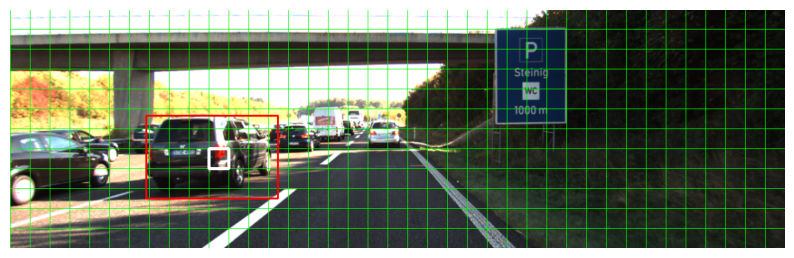

In [18]:
def load_image_resize(id):
    img = cv2.imread(f'training/image_2/{id}.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (1248, 384))
    return img

def image_grid(img):
    for col in range(40):
        x = int(col * 1248 / 39)
        cv2.line(img, (x, 0), (x, 384), (0, 255, 0), 1)
    for row in range(13):
        y = int(row * 384 / 12)
        cv2.line(img, (0, y), (1248, y), (0, 255, 0), 1)
    return img

img = image_grid(load_image_resize('000047'))

row = df_cars[df_cars['image_id']=='000047'].iloc[2]
i, j = row['cell_i'], row['cell_j']
cx = (j + row['bx']) * 32
cy = (i + row['by']) * 32
hw = np.exp(row['bw']) * 32 / 2
hh = np.exp(row['bh']) * 32 / 2

cv2.rectangle(img, (int(cx-hw), int(cy-hh)), (int(cx+hw), int(cy+hh)), (255, 0, 0), 2)

cv2.rectangle(img, (j*32, i*32), ((j+1)*32, (i+1)*32), (255, 255, 255), 3)

plt.figure(figsize=(10, 4))
plt.imshow(img)
plt.axis('off')
plt.show()

The transformed data was successfully decoded. We can see the image divided into 468 cells (39 x 12) each measuring 32 pixels. For this example, I've selected a single object; the white square marks the cell containing the center of the object's (car's) bounding box, and the red frame marks the bounding box itself.

Now we need to create a **data generator function** (images and targets) for training and validating the model. The generator contains an infinite loop in which it creates batches of images and targets for training the model. Each batch contains several resized and normalized (0..1) images and a three-dimensional tensor of size 12 x 39 x 5 (unlike images, where width comes first, then height, tensors usually have rows first, then columns) for each image. This is the same grid whose cells contain the bounding box information we discussed above.

In [19]:
# I moved it into a separate function, since I will use it again later
def load_image_resize_norm(id):
    return load_image_resize(id).astype('float32') / 255.0

# I moved it into a separate function, since I will use it again later
def encode_target(id):
    target = np.zeros((12, 39, 5), dtype=np.float32)
                
    for row in df_cars[df_cars['image_id']==id].itertuples():
        i, j = row.cell_i, row.cell_j
        if target[i, j, 4] == 1.0: continue                   # there is already an object in this cell - ignore
        target[i, j] = [row.bx, row.by, row.bw, row.bh, 1.0]  # 5 parameters in each cell
    return target
    

def data_generator(ids, batch_size, shuffle=True):
    
    n = len(ids)
    while True:
        if shuffle:
            np.random.shuffle(ids)

        for start in range(0, n, batch_size):
            batch_ids = ids[start:min(start + batch_size, n)]

            batch_imgs = []
            batch_targets = []

            if len(batch_ids) == 0:
                continue
            
            for id in batch_ids:
                batch_imgs.append(load_image_resize_norm(id))
                batch_targets.append(encode_target(id))

            batch_imgs = np.stack(batch_imgs, axis=0).astype(np.float32)
            batch_targets = np.stack(batch_targets, axis=0).astype(np.float32)

            yield batch_imgs, batch_targets

In [20]:
train, val = train_test_split(df_cars['image_id'].unique(), test_size=0.1, random_state=42)
print('train:', len(train), 'val:', len(val))

train: 6015 val: 669


I've split all the images (or rather, image identifiers) into training and validation sets. Now on to the model itself.

# Model implementation

I also borrowed the model's architecture from early versions of YOLO and simplified it for my purposes. It includes **six convolutional layers**, each with **batch normalization**, **ReLU activation**, and **pooling**. With each block, the **image size is reduced by a factor of four** (halving the width and height), and the number of filters doubles. Ultimately, the image is convolved **to 12 x 39**, which is the number of grid cells.

Finally, there's another convolutional layer with five filters, one for each output (object presence + bounding box center coordinates in the cell + bounding box height and width). The model's output layer has no activation function, meaning it returns **raw logits**, since different outputs will be activated differently later. Ultimately, the **model will return 12 x 39 x 5**, or **2,340 outputs**.

In [21]:
def build_model():
    return tf.keras.Sequential([
        layers.Input(shape=(384, 1248, 3)),
    
        layers.Conv2D(16, 3, 1, 'same', use_bias=False, kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.1),
        layers.MaxPooling2D(2, 2),  # 192x624
    
        layers.Conv2D(32, 3, 1, 'same', use_bias=False, kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.1),
        layers.MaxPooling2D(2, 2),  # 96x312
    
        layers.Conv2D(64, 3, 1, 'same', use_bias=False, kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.1),
        layers.MaxPooling2D(2, 2),  # 48x156
    
        layers.Conv2D(128, 3, 1, 'same', use_bias=False, kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.1),
        layers.MaxPooling2D(2, 2),  # 24x78
    
        layers.Conv2D(256, 3, 1, 'same', use_bias=False, kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.1),
        layers.MaxPooling2D(2, 2),  # 12x39
    
        layers.Conv2D(512, 3, 1, 'same', use_bias=False, kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.1),
    
        # Output 12 x 39 x [bx, by, bw, bh, obj]
        layers.Conv2D(5, 1, 1, 'same', kernel_initializer='he_normal'),
    ])

I had to write my own **loss function** because the model outputs five parameters for each cell. They are activated differently, and the error is calculated differently for each. Let's go over them:

- The first two outputs are the relative coordinates of the center of the bounding box in the cell. Sigmoid activation is used, as it is most suitable for values ​​from 0 to 1 (relative coordinates).
- The next two outputs are the width and height of the bounding box, as the logarithm of the scale; they are simply clipped from -4 to 4.
- The last output is the presence or absence of the center of the object in the cell, objectness, essentially a binary classification, using sigmoid activation.

For coordinates, the loss is calculated as MSE, for objectness as Cross-entropy, then everything is summed up and returned as the total loss.

In [22]:
def make_loss(lambda_coord=5.0, lambda_noobj=2.0):
    def loss_fn(y_true, y_pred):

        # bx, by via sigmoid; bw, bh just clip
        pred_xywh  = tf.concat([
            tf.sigmoid(y_pred[..., 0:2]),
            tf.clip_by_value(y_pred[..., 2:4], -4.0, 4.0),
        ], axis=-1)

        obj_mask   = y_true[..., 4]
        noobj_mask = 1.0 - obj_mask

        # coordinate loss
        coord_sq   = tf.reduce_sum(tf.square(pred_xywh - y_true[..., 0:4]), axis=-1)  # (B, 12, 39)
        coord_loss = tf.reduce_sum(obj_mask * coord_sq) / (tf.reduce_sum(obj_mask) + 1e-6)

        # objectness loss
        obj_loss = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true[..., 4],
            logits=y_pred[..., 4]
        )

        obj_loss_obj   = tf.reduce_sum(obj_mask   * obj_loss) / (tf.reduce_sum(obj_mask)   + 1e-6)
        obj_loss_noobj = tf.reduce_sum(noobj_mask * obj_loss) / (tf.reduce_sum(noobj_mask) + 1e-6)

        total_loss = lambda_coord * coord_loss + obj_loss_obj + lambda_noobj * obj_loss_noobj
        return total_loss
    return loss_fn

# Hyperparameters tuning

First, I will select the optimal parameters for the model using Random Search.

In [23]:
BATCH_SIZE = 4

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

results = []

for trial in range(10):
    start = time.time()

    # random hyperparameters for model and loss function
    lr = 10 ** random.uniform(math.log10(1e-5), math.log10(3e-4))
    
    lambda_coord = random.uniform(2.0, 10.0)
    lambda_noobj = random.uniform(0.5, 4.0)

    # a new model for every trial
    model = build_model()

    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=make_loss(lambda_coord, lambda_noobj)) # loss with hyperparameters


    history = model.fit(
        data_generator(train, BATCH_SIZE),
        steps_per_epoch=len(train) // BATCH_SIZE,
        epochs=30,
        validation_data=data_generator(val, BATCH_SIZE, shuffle=False),
        validation_steps=max(1, len(val) // BATCH_SIZE),
        verbose=0
    )

    # save configuration, history, best epoch, and val_loss
    results.append({
        'config': {'lr': lr, 'lambda_coord': lambda_coord, 'lambda_noobj': lambda_noobj},
        'history': history.history,
        'best_epoch': np.argmin(history.history['val_loss']),
        'best_val_loss': min(history.history['val_loss']),
    })

    print(f'Trial #{trial} done, elapsed time {((time.time() - start) / 60):.2f} minutes')


I0000 00:00:1764545308.770385     157 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Trial #0 done, elapsed time 38.00 minutes
Trial #1 done, elapsed time 37.26 minutes
Trial #2 done, elapsed time 37.56 minutes
Trial #3 done, elapsed time 36.99 minutes
Trial #4 done, elapsed time 37.45 minutes
Trial #5 done, elapsed time 38.81 minutes
Trial #6 done, elapsed time 37.06 minutes
Trial #7 done, elapsed time 37.33 minutes
Trial #8 done, elapsed time 37.70 minutes
Trial #9 done, elapsed time 37.15 minutes


In [24]:
pd.DataFrame([r['config'] | {'best_epoch': r['best_epoch'], 'best_val_loss': r['best_val_loss']} for r in results])

,lr,lambda_coord,lambda_noobj,best_epoch,best_val_loss
0,0.000088,2.200086,1.462603,9,0.883622
1,0.000064,6.723940,0.611239,24,1.727083
2,0.000020,7.199076,2.407295,28,2.594124
3,0.000132,3.277275,1.979150,8,1.133028
4,0.000036,4.871835,1.703845,19,1.575053
5,0.000274,5.028275,2.432142,10,1.425972
6,0.000019,2.556441,2.814422,28,1.226898
7,0.000036,5.627282,3.419386,18,2.034484
8,0.000242,7.184283,2.631959,13,1.827309
9,0.000025,9.403129,2.908567,23,3.049865


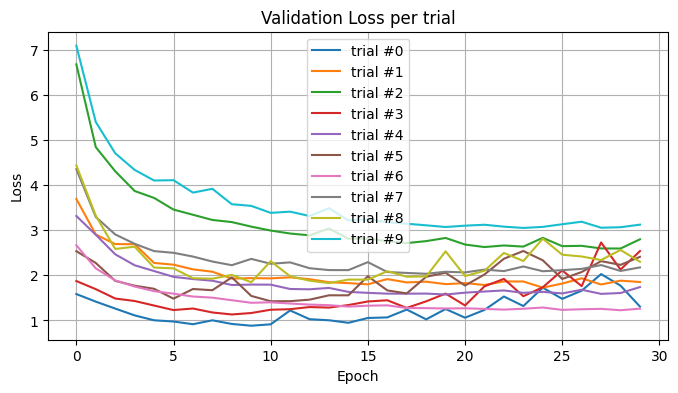

In [25]:
plt.figure(figsize=(8, 4))
for i, r in enumerate(results):
    plt.plot(r['history']['val_loss'], label=f'trial #{i}')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss per trial')
plt.legend()
plt.grid(True)
plt.show()

As you can see from the table and graphs, the smallest loss was for **trial #0** at `epoch 9` with parameters `lr=0.000088`, `lambda_coord=2.200086`, and `lambda_noobj=1.462603`. Then the model begins to overfit, and the validation loss begins to increase.

# Training and evaluating

I'll make a separate graph of this trial, and also recreate the model with optimal parameters, train it for 9 epochs, and perform inference for the validation sample.

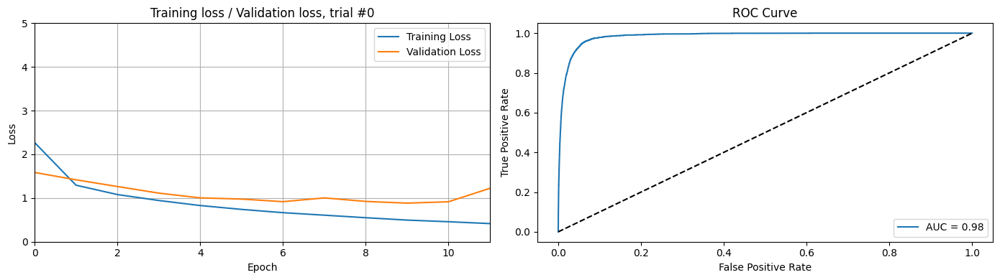

In [26]:
best_trial = min(results, key=lambda r: r['best_val_loss'])

fig, ax = plt.subplots(1, 2, figsize=(14,4))

ax[0].plot(results[0]['history']['loss'], label='Training Loss')
ax[0].plot(results[0]['history']['val_loss'], label='Validation Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].set_ylim(0,5)
ax[0].set_xlim(0, best_trial['best_epoch']+2)
ax[0].set_title('Training loss / Validation loss, trial #0')
ax[0].legend()
ax[0].grid(True)


random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

model = build_model()
model.compile(optimizer=tf.keras.optimizers.Adam(best_trial['config']['lr']),
              loss=make_loss(best_trial['config']['lambda_coord'], best_trial['config']['lambda_noobj']))

history = model.fit(
    data_generator(train, BATCH_SIZE),
    epochs=best_trial['best_epoch'],
    steps_per_epoch=len(train) // BATCH_SIZE,
    validation_data=data_generator(val, BATCH_SIZE, shuffle=False),
    validation_steps=max(1, len(val) // BATCH_SIZE),
    verbose=0
)

pred, target = [], []
for id in val:
    pred.append(model.predict(load_image_resize_norm(id)[None, ...], verbose=0)[0])
    target.append(encode_target(id))

# convert lists into arrays
val_pred   = np.stack(pred, axis=0)
val_target = np.stack(target, axis=0)

def sigmoid(z):
    return 1.0/(1.0+np.exp(-z))

true_objects = val_target[..., 4].reshape(-1)          # N * 12 * 39
pred_objects = sigmoid(val_pred[..., 4]).reshape(-1)   # N * 12 * 39

fpr, tpr, thresholds = roc_curve(true_objects, pred_objects)
ax[1].plot(fpr, tpr, label=f'AUC = {auc(fpr, tpr):.2f}')
ax[1].plot([0, 1], [0, 1], 'k--')  # baseline
ax[1].set_xlabel('False Positive Rate')
ax[1].set_ylabel('True Positive Rate')
ax[1].set_title('ROC Curve')
ax[1].legend(loc='lower right')

plt.tight_layout()
plt.show()

Well, both graphs look quite good, but I suspect this is due to a severe imbalance, as the grid cells without cars in the image are incomparably larger than the cells with cars. That is, even if the model hadn't predicted a single car, the True Negative would still be so high that it would dominate any errors. So, graphs aside, let's look at what we get in the images.

But first, let's figure out what the model actually predicted.

In [27]:
print(val_pred.shape)

(669, 12, 39, 5)


A four-dimensional tensor, where 669 is the number of images in the validation set, 12 x 39 is the number of cells in the image grid, and 5 is the prediction vector for a single cell in this grid. The first four elements of this vector correspond to the bounding box, and the last one corresponds to the presence or absence of the object's (car's) center in the cell.

I'll take one image (the same one we looked at before training the model) and explain it using it.

In [28]:
pred_single_image = model.predict(load_image_resize_norm('000047')[None, ...], verbose=0)[0]
pred_single_image.shape

(12, 39, 5)

As I said, the last element in the prediction vector is the prediction of the presence or absence of the object's center in the cell, but this is a **logit**, and to get the probability you need to apply the **sigmoid** function to it.

In [29]:
objects = sigmoid(pred_single_image[..., 4])
objects.shape

(12, 39)

Now all that remains is the predictions for each grid cell of the image, and they can be output as a heatmap.

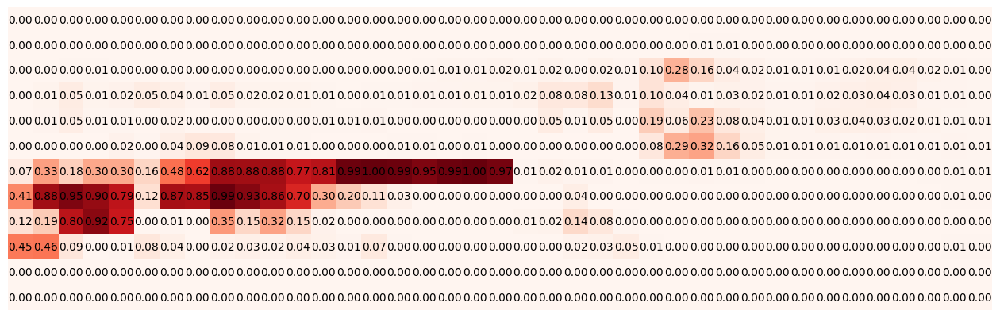

In [30]:
def obj_heatmap(matrix):
    plt.figure(figsize=(16,5))
    img = plt.imshow(matrix, cmap='Reds')
    
    for i in range(12):
        for j in range(39):
            plt.text(j, i, f'{matrix[i, j]:.2f}',
                     ha='center', va='center', color='black')
    
    plt.axis('off')
    plt.show()

obj_heatmap(objects)

Typically, a threshold of 0.5 is used for sigmoid results. I will set all values ​​below this threshold to zero, and leave everything above as probabilities, so that it reflects how the model estimates the probability of the object's center in each cell.

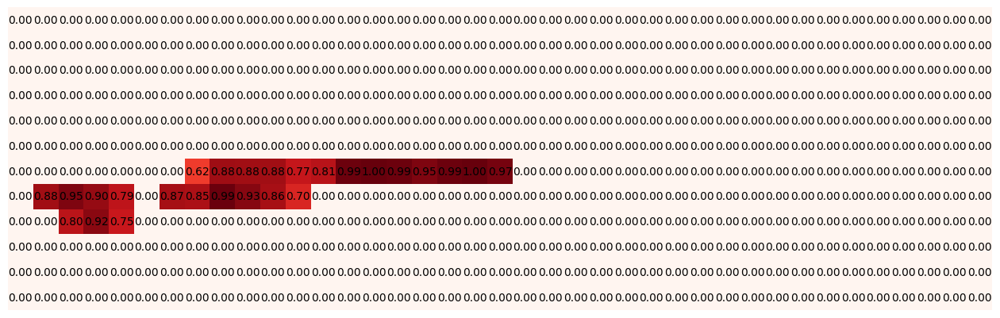

In [31]:
objects[objects < 0.5] = 0

obj_heatmap(objects)

It's cleaner now, and you can overlay the relevant probabilities directly on top of the grid image to make it clearer what exactly is in the image in those cells where the model predicted objects.

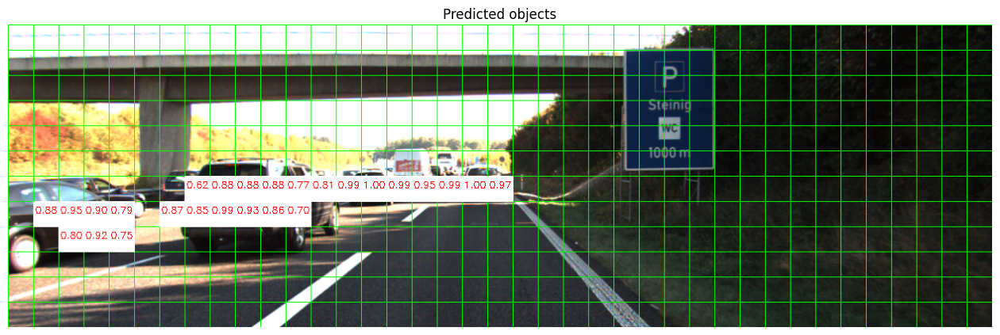

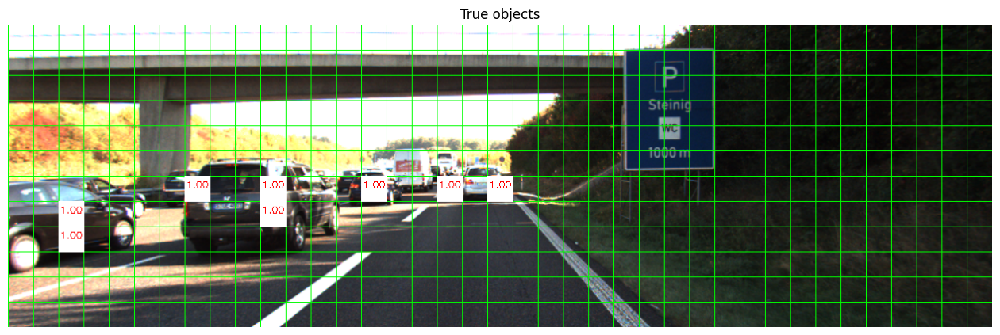

In [32]:
img_pred = image_grid(load_image_resize('000047'))

def image_obj_cell(img, objects, threshold=0.5):
    for i in range(12):
        for j in range(39):
            if objects[i][j] > threshold:
                xmin, ymin = j * 32, i * 32
                cv2.rectangle(img, (xmin, ymin), (xmin+32, ymin+32), (255, 255, 255), -1)
                cv2.putText(img, f"{objects[i][j]:.2f}", (xmin + 2, ymin + 15),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 0, 0), 1)

image_obj_cell(img_pred, objects)

plt.figure(figsize=(16,5))
plt.imshow(img_pred)
plt.axis('off')
plt.title('Predicted objects')
plt.show()

img_true = image_grid(load_image_resize('000047'))
image_obj_cell(img_true, encode_target('000047')[..., 4])
plt.figure(figsize=(16,5))
plt.imshow(img_true)
plt.axis('off')
plt.title('True objects')
plt.show()

The top image shows the model's predicted object centers, while the bottom image shows the true objects. It's clear that the model is working, with some objects being accurately predicted, but overall, the model is significantly **overestimating**, finding too many objects, and the default threshold value of 0.5 doesn't seem appropriate. It's worth increasing the threshold value, but not randomly, but by determining which threshold value yields the best **F1 Score** and **Matthews Correlation Coefficient (MCC)** metrics.

To do this, I will make a graph of the F1 and MCC metrics values ​​depending on the threshold value.

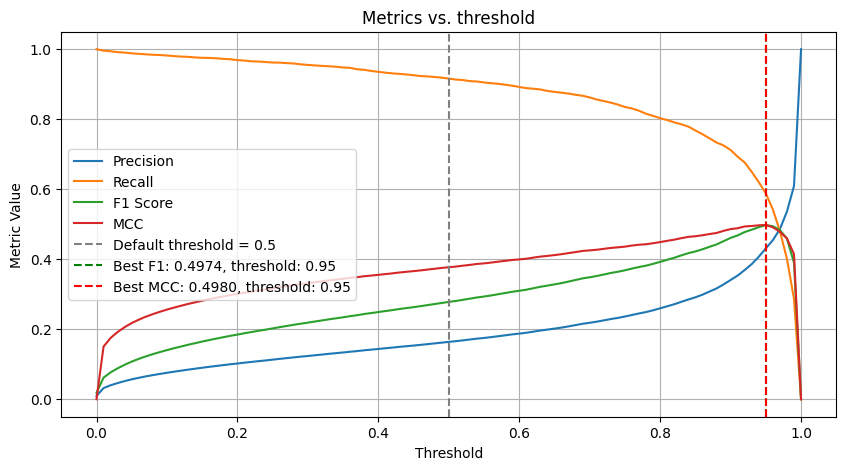

In [33]:
thresholds = np.arange(0.0, 1.01, 0.01)

plt.figure(figsize=(10,5))

precisions, recalls, f1s, mccs = [], [], [], []
for thr in thresholds:
    pred_obj = (pred_objects >= thr).astype(int)
    precisions.append(precision_score(true_objects, pred_obj, zero_division=1))
    recalls.append(recall_score(true_objects, pred_obj))
    f1s.append(f1_score(true_objects, pred_obj))
    mccs.append(matthews_corrcoef(true_objects, pred_obj))

best_f1_idx = np.argmax(f1s)
best_f1_threshold = thresholds[best_f1_idx]
best_mcc_idx = np.argmax(mccs)
best_mcc_threshold = thresholds[best_mcc_idx]

plt.plot(thresholds, precisions, label='Precision')
plt.plot(thresholds, recalls, label='Recall')
plt.plot(thresholds, f1s, label='F1 Score')
plt.plot(thresholds, mccs, label='MCC')
plt.axvline(0.5, color='gray', linestyle='--', label='Default threshold = 0.5')
plt.axvline(best_f1_threshold, color='green', linestyle='--',
            label=f"Best F1: {f1s[best_f1_idx]:.4f}, threshold: {best_f1_threshold:.2f}")
plt.axvline(best_mcc_threshold, color='red', linestyle='--',
            label=f"Best MCC: {mccs[best_mcc_idx]:.4f}, threshold: {best_mcc_threshold:.2f}")
plt.xlabel('Threshold')
plt.ylabel('Metric Value')
plt.title('Metrics vs. threshold')
plt.legend()
plt.grid(True)
plt.show()

Both the F1 score and MCC metrics insist that the **best threshold** value is **0.95**. This initially seems alarming, but given the strong imbalance in favor of True Negative, it seems appropriate. Both metrics seem fairly robust to imbalanced classes, but as always, the threshold is a **tradeoff** between **Type I** and **Type II** errors. However, in my opinion, such a threshold value would make the evaluation overly conservative, worsening vehicle detection in favor of reducing false positives.

I'll show this in a confusion matrix for threshold values ​​of 0.8, 0.85, and 0.95.

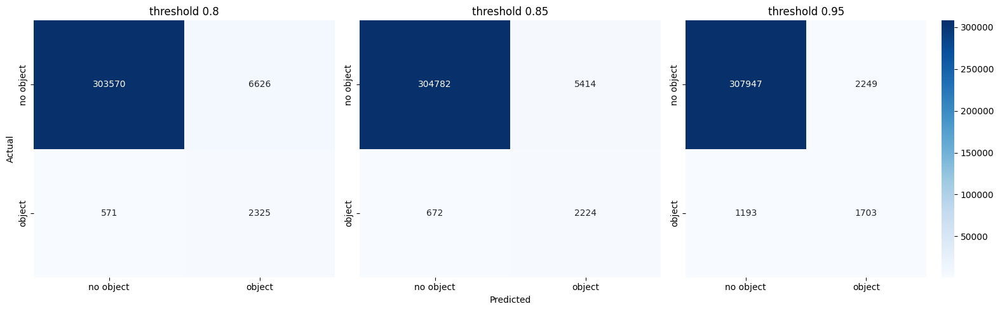

In [34]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

cm8 = confusion_matrix(true_objects, (pred_objects > 0.8).astype(int))
cm85 = confusion_matrix(true_objects, (pred_objects > 0.85).astype(int))
cm95 = confusion_matrix(true_objects, (pred_objects > 0.95).astype(int))

labels = ['no object', 'object']

sns.heatmap(cm8, annot=True, fmt='d', cmap='Blues', ax=ax[0], cbar=False,
        xticklabels=labels, yticklabels=labels)
ax[0].set_xlabel('')
ax[0].set_ylabel('Actual')
ax[0].set_title('threshold 0.8')

sns.heatmap(cm85, annot=True, fmt='d', cmap='Blues', ax=ax[1], cbar=False,
        xticklabels=labels, yticklabels=labels)
ax[1].set_xlabel('Predicted')
ax[1].set_ylabel('')
ax[1].set_title('threshold 0.85')

sns.heatmap(cm95, annot=True, fmt='d', cmap='Blues', ax=ax[2],
        xticklabels=labels, yticklabels=labels)
ax[2].set_xlabel('')
ax[2].set_ylabel('')
ax[2].set_title('threshold 0.95')

plt.tight_layout()
plt.show()

You can see that increasing the threshold significantly reduces the Type I Error (False Positive), as does the number of recognized objects. In my opinion, a threshold value of around 0.85 seems more balanced, even though it performs slightly worse in the F1 and MCC metrics (in reality, the MCC is almost identical). So, I'll use a threshold value of 0.85.

Let's look at an image with this threshold.

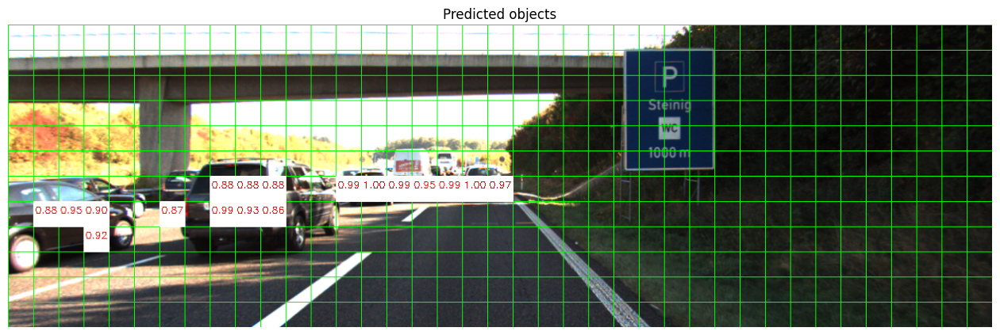

In [35]:
img_pred = image_grid(load_image_resize('000047'))

image_obj_cell(img_pred, objects, threshold=0.85)

plt.figure(figsize=(16,5))
plt.imshow(img_pred)
plt.axis('off')
plt.title('Predicted objects')
plt.show()

The number of objects has noticeably decreased, and I have an idea for how to reduce them even further. But first, I need to decode the remaining vector elements for each cell so that the boundary boxes can be drawn.

Since I'm decoding everything returned by the model this time, I'll decode the objectness again using sigmoid activation. I'll apply the same activation to the relative coordinates of the boundary box center inside the cell, and clip the height and width to values ​​between -4 and 4. Basically, it's the same as I did in the loss function.

In [36]:
def decode_prediction(pred, threshold=0.5):

    # for each grid cell activate values
    obj = sigmoid(pred[..., 4])        # objectness
    bx  = sigmoid(pred[..., 0])        # bounding box relative center x
    by  = sigmoid(pred[..., 1])        # bounding box relative center y
    bw  = np.clip(pred[..., 2], -4, 4)  # bounding box width
    bh  = np.clip(pred[..., 3], -4, 4)  # bounding box height

    # active cells mask
    mask = obj > threshold

    if not np.any(mask):
        return (np.zeros((0, 4), dtype=np.float32),
                np.zeros((0,), dtype=np.float32),
                np.zeros((0,), dtype=np.int32),
                np.zeros((0,), dtype=np.int32))

    # cell indices where obj > threshold
    i, j = np.where(mask)

    # restore absolute center values
    # and bounding box dimensions in pixels
    cx = (j + bx[mask]) * 32
    cy = (i + by[mask]) * 32

    bw = np.exp(bw[mask]) * 32
    bh = np.exp(bh[mask]) * 32

    # absolute bounding box values ​​in pixels
    xmin = cx - bw / 2.0
    ymin = cy - bh / 2.0
    xmax = cx + bw / 2.0
    ymax = cy + bh / 2.0

    boxes = np.stack([xmin, ymin, xmax, ymax], axis=-1).astype(np.float32)
    scores = obj[mask].astype(np.float32)

    return boxes, scores, i, j

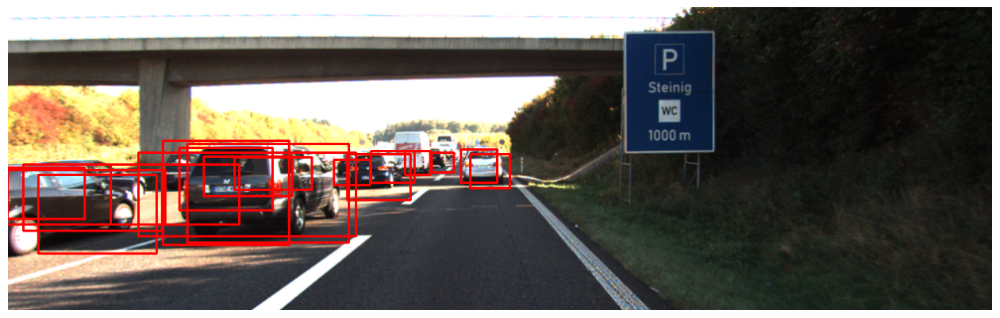

In [37]:
boxes, scores, i, j = decode_prediction(pred_single_image, threshold=0.85)

img = load_image_resize('000047')

for b in boxes:
    cv2.rectangle(img, (int(b[0]), int(b[1])), (int(b[2]), int(b[3])), (255, 0, 0), 2)

plt.figure(figsize=(16,5))
plt.imshow(img)
plt.axis('off')
plt.show()

As expected, if we had too many detected objects in the image, there would also be a lot of bounding boxes. It's clear that some boxes belong to the same cars and largely overlap each other.

To address this, YOLO uses an algorithm called **Non-Maximum Suppression (NMS)**, which finds overlapping boxes, keeps the box with the highest score, and removes the rest. This algorithm, in turn, uses the **Intersection over Union (IoU)** metric, which measures the extent to which two boxes intersect.

I'll implement a slightly simplified version of this algorithm and apply it to prediction. We'll see how well it removes the extra bounding boxes in the image above.

In [38]:
def iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_w = max(min(x1_max, x2_max) - max(x1_min, x2_min), 0.0)
    inter_h = max(min(y1_max, y2_max) - max(y1_min, y2_min), 0.0)
    inter_area = inter_w * inter_h # the interior intersection of two boxes

    area1 = max(x1_max - x1_min, 0.0) * max(y1_max - y1_min, 0.0)
    area2 = max(x2_max - x2_min, 0.0) * max(y2_max - y2_min, 0.0)

    union = area1 + area2 - inter_area
    return inter_area / (union + 1e-9)

def nms(boxes, scores, iou_thr=0.5):
    if len(boxes) == 0:
        return np.array([], dtype=np.int32)
    idxs = np.argsort(-scores)
    keep = []
    while len(idxs) > 0:
        i = idxs[0]
        keep.append(i)
        if len(idxs) == 1:
            break
        rest = idxs[1:]
        ious = np.array([iou(boxes[i], boxes[j]) for j in rest])
        idxs = rest[ious < iou_thr]
    return np.array(keep, dtype=np.int32)

keep = nms(boxes, scores, iou_thr=0.2)

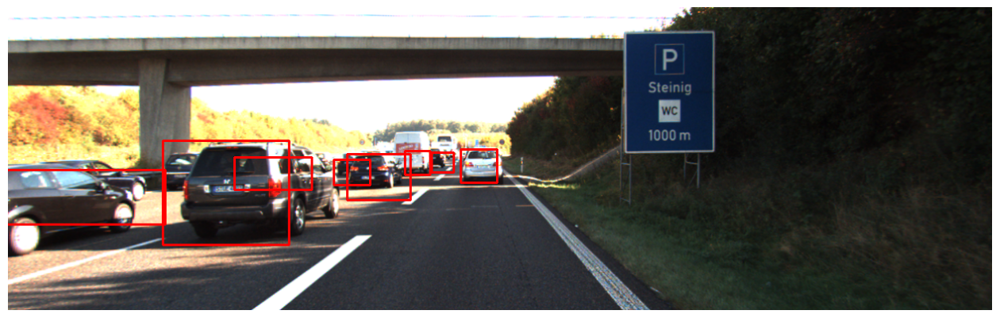

In [39]:
img = load_image_resize('000047')

for i in keep:
    cv2.rectangle(img, (int(boxes[i][0]), int(boxes[i][1])), (int(boxes[i][2]), int(boxes[i][3])), (255, 0, 0), 2)

plt.figure(figsize=(16,5))
plt.imshow(img)
plt.axis('off')
plt.show()

The bounding boxes have become smaller, and the detection is much cleaner. It looks like NMS has done the job, although the overlap threshold had to be lowered to 0.2. But anyway, it now looks more like the detected objects, and the bounding boxes generally more or less match the vehicles.

Let's look at the prediction and NMS results in a few more images.

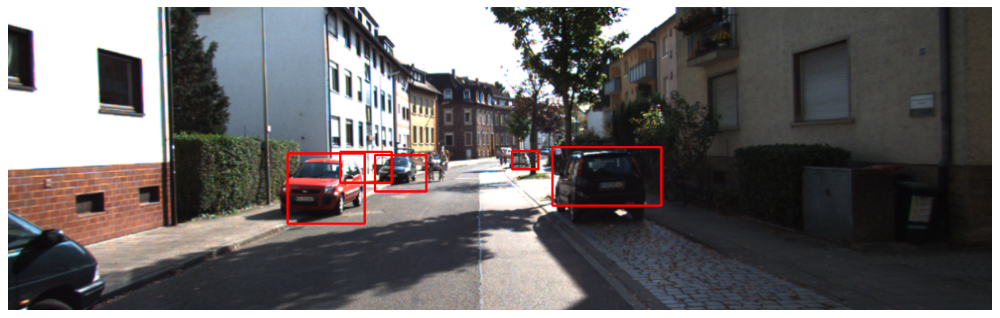

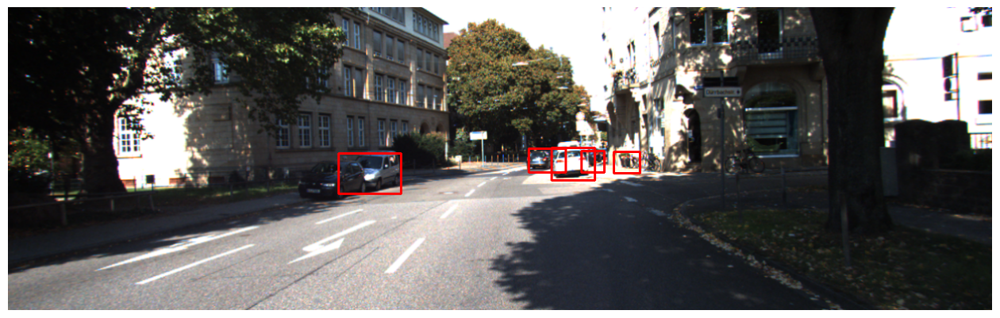

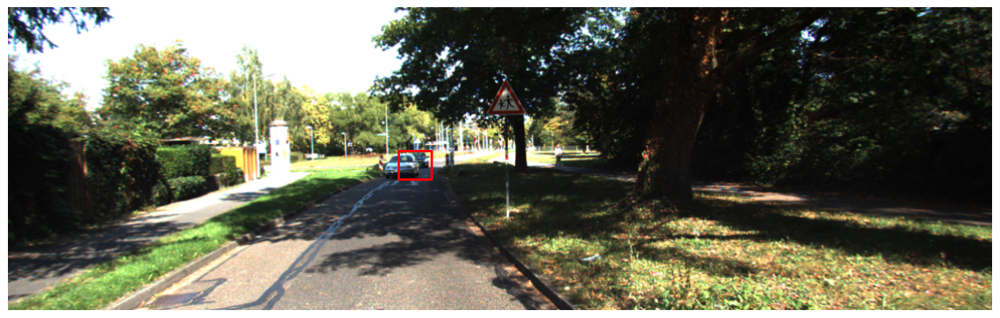

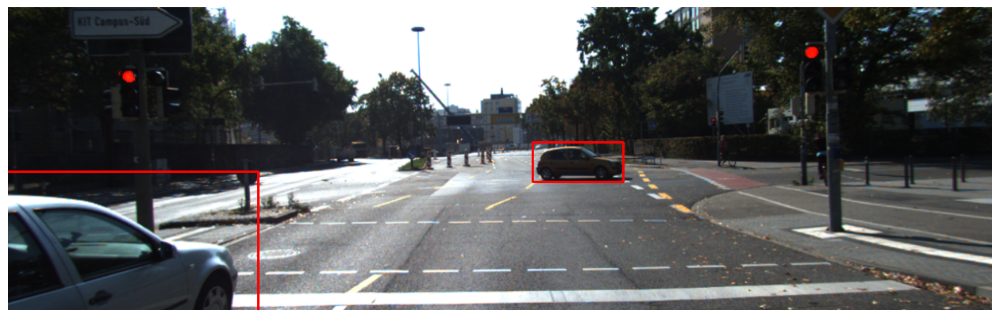

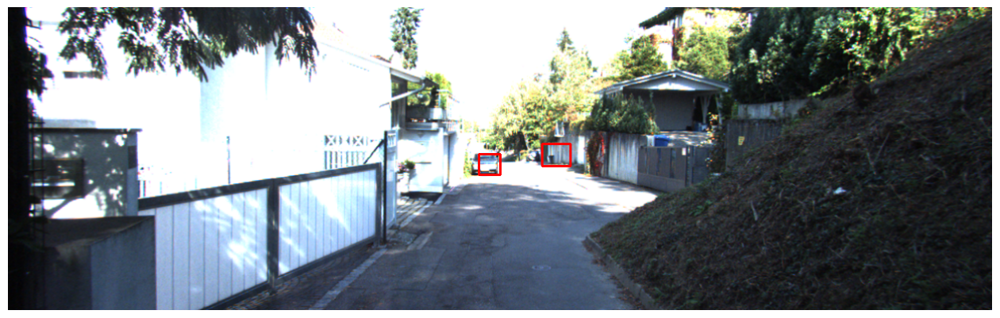

In [40]:
np.random.seed(42)

for i in np.random.choice(range(len(val)), size=5, replace=False):
    img = load_image_resize(val[i])

    boxes, scores, _, _ = decode_prediction(val_pred[i], threshold=0.85)
    for j in nms(boxes, scores, iou_thr=0.2):
        cv2.rectangle(img, (int(boxes[j][0]), int(boxes[j][1])), (int(boxes[j][2]), int(boxes[j][3])), (255, 0, 0), 2)

    plt.figure(figsize=(16,5))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Alternative model: pre-trained YOLO

As an alternative, I want to try a real YOLO v8 object detection model. I'll use a pre-trained version on the Common Objects in Context (COCo) dataset, a large-scale object detection, segmentation, and captioning dataset.

I'll further train it on my training set and compare the results. I expect it to outperform my simplified model.

But first, I'll prepare a dataset in a format compatible with this model.

In [41]:
def make_yolo_dataset(df, batch_size=4, shuffle=True):
    groups = df.groupby('image_id') # there can be many objects in one image

    image_paths = []
    boxes_list = []

    for img_path, g in groups:
        image_paths.append(img_path)
        boxes = g[['rxmin', 'rymin', 'rxmax', 'rymax']].values.astype('float32')
        boxes_list.append(boxes)

    image_paths = np.array(image_paths)

    def gen():
        for path, boxes in zip(image_paths, boxes_list):
            yield {
                'images': load_image_resize_norm(path),
                'bounding_boxes': {
                    'boxes': boxes,
                    'classes': np.zeros((boxes.shape[0],), dtype='float32'), # one class: 0 for all boxes
                },
            }

    output_signature = {
        'images': tf.TensorSpec(shape=(384, 1248, 3), dtype=tf.float32),
        'bounding_boxes': {
            'boxes': tf.TensorSpec(shape=(None, 4), dtype=tf.float32),
            'classes': tf.TensorSpec(shape=(None,), dtype=tf.float32),
        },
    }

    ds = tf.data.Dataset.from_generator(gen, output_signature=output_signature)

    if shuffle:
        ds = ds.shuffle(buffer_size=len(image_paths))

    # Ragged batch, because the number of boxes in the photo is different
    ds = ds.ragged_batch(batch_size, drop_remainder=True)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds

In [42]:
# backbone with COCO pre-trained
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    'yolo_v8_s_backbone_coco',  # small model because I have weak 3060 card
    load_weights=True,
)

yolo = keras_cv.models.YOLOV8Detector(
    num_classes=1,                 # one class: car
    bounding_box_format='xyxy',    # as in df
    backbone=backbone,
    fpn_depth=3,
)

optimizer = keras.optimizers.Adam(learning_rate=1e-5)

yolo.compile(
    optimizer=optimizer,
    classification_loss='binary_crossentropy',
    box_loss='ciou',   # ready CIoU-loss
)

/usr/local/lib/python3.11/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.11/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


In [43]:
EPOCHS = 30

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

yolo_history = yolo.fit(
    make_yolo_dataset(df_cars[df_cars['image_id'].isin(train)].copy(), batch_size=4, shuffle=True),
    validation_data=make_yolo_dataset(df_cars[df_cars['image_id'].isin(val)].copy(),   batch_size=4, shuffle=False),
    epochs=EPOCHS,
    verbose=0
)

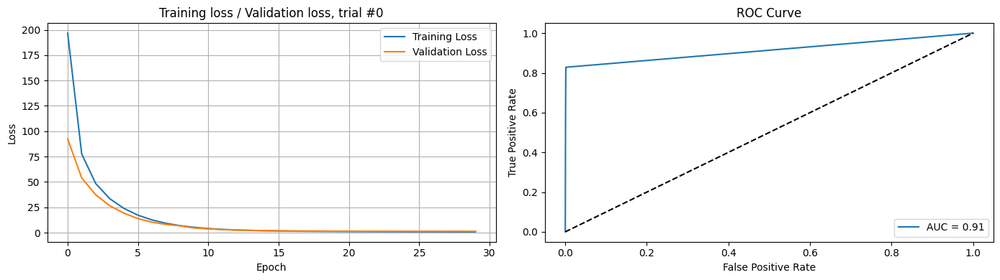

In [44]:
fig, ax = plt.subplots(1, 2, figsize=(14,4))

ax[0].plot(yolo_history.history['loss'], label='Training Loss')
ax[0].plot(yolo_history.history['val_loss'], label='Validation Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title('Training loss / Validation loss, trial #0')
ax[0].legend()
ax[0].grid(True)


def yolo_decode(pred):
    result = []
    for n, confidence in enumerate(pred['confidence']):

        cells = np.zeros((12, 39), dtype=np.float32)

        for m, conf in enumerate(confidence):
            if conf < 0: continue

            box = pred['boxes'][n][m]
            j = ((box[0] + box[2]) / 2 / 32).astype(int).clip(0, 38)
            i = ((box[1] + box[3]) / 2 / 32).astype(int).clip(0, 11)
            if cells[i, j] > conf: continue
            cells[i, j] = conf
    
        result.append({
            'boxes': pred['boxes'][n],
            'cells': cells,
            'confidence': pred['confidence'][n]
        })
    return result

yolo_pred = []
for id in val:
    yolo_pred.extend(yolo_decode(yolo.predict(load_image_resize_norm(id)[None, ...], verbose=0)))


yolo_objects = np.stack([pred['cells'] for pred in yolo_pred], axis=0).reshape(-1)

fpr, tpr, thresholds = roc_curve(true_objects, yolo_objects)
ax[1].plot(fpr, tpr, label=f'AUC = {auc(fpr, tpr):.2f}')
ax[1].plot([0, 1], [0, 1], 'k--')  # baseline
ax[1].set_xlabel('False Positive Rate')
ax[1].set_ylabel('True Positive Rate')
ax[1].set_title('ROC Curve')
ax[1].legend(loc='lower right')

plt.tight_layout()
plt.show()

The loss graph looks completely different from my model's, but they **can't be directly compared**; these models have completely different loss functions.

The ROC Curve graph looks unusual, but the YOLO model includes a Non-Maximum Suppression (NMS) algorithm, similar to the one I used for post-processing on my model. And the confidence values ​​the model produced are not quite the typical sigmoid activation results.

Therefore, before displaying anything in the images, I'll create a **F1 Score** and **MCC** graph to find the best threshold value, assuming it will be significantly different from the standard 0.5.

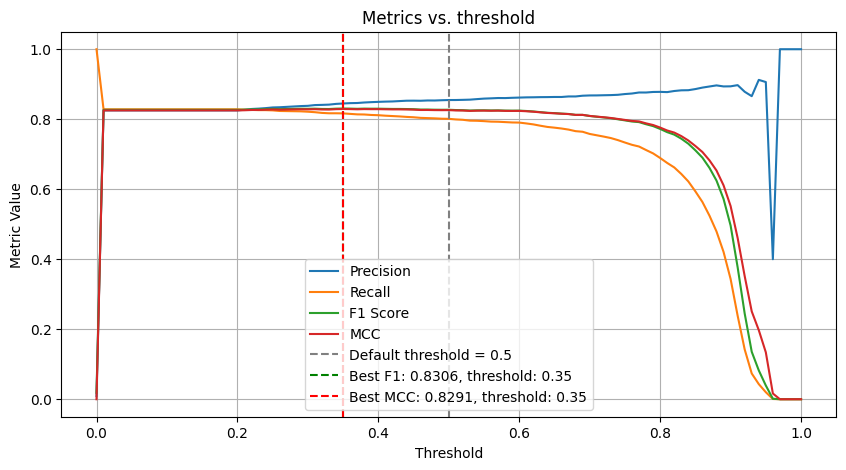

In [45]:
thresholds = np.arange(0.0, 1.01, 0.01)

plt.figure(figsize=(10,5))

precisions, recalls, f1s, mccs = [], [], [], []
for thr in thresholds:
    pred_obj = (yolo_objects >= thr).astype(int)
    precisions.append(precision_score(true_objects, pred_obj, zero_division=1))
    recalls.append(recall_score(true_objects, pred_obj))
    f1s.append(f1_score(true_objects, pred_obj))
    mccs.append(matthews_corrcoef(true_objects, pred_obj))

best_f1_idx = np.argmax(f1s)
best_f1_threshold = thresholds[best_f1_idx]
best_mcc_idx = np.argmax(mccs)
best_mcc_threshold = thresholds[best_mcc_idx]

plt.plot(thresholds, precisions, label='Precision')
plt.plot(thresholds, recalls, label='Recall')
plt.plot(thresholds, f1s, label='F1 Score')
plt.plot(thresholds, mccs, label='MCC')
plt.axvline(0.5, color='gray', linestyle='--', label='Default threshold = 0.5')
plt.axvline(best_f1_threshold, color='green', linestyle='--',
            label=f"Best F1: {f1s[best_f1_idx]:.4f}, threshold: {best_f1_threshold:.2f}")
plt.axvline(best_mcc_threshold, color='red', linestyle='--',
            label=f"Best MCC: {mccs[best_mcc_idx]:.4f}, threshold: {best_mcc_threshold:.2f}")
plt.xlabel('Threshold')
plt.ylabel('Metric Value')
plt.title('Metrics vs. threshold')
plt.legend()
plt.grid(True)
plt.show()

As I expected, the metric graphs look very unusual. In fact, any value other than 0 is already a potentially detected object. So, zero here is something close to the standard value of 0.5 in a regular sigmoid activation. But a regular sigmoid activation doesn't always yield the best tradeoff between detected objects and false positives. Judging by the graph, the best ratio, and therefore the best F1 Score and MCC metrics, are achieved with a **threshold value of 0.35**.

Using this value, I'll plot the detected bounding box centers on the image and compare them with the true values. Then, I'll plot the resulting bounding boxes on the image.

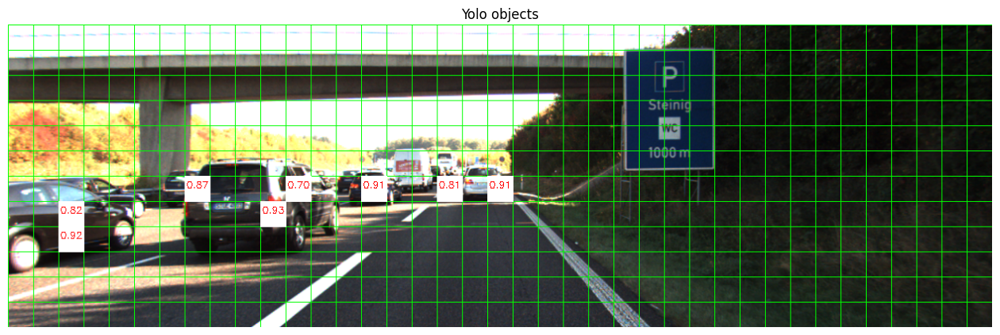

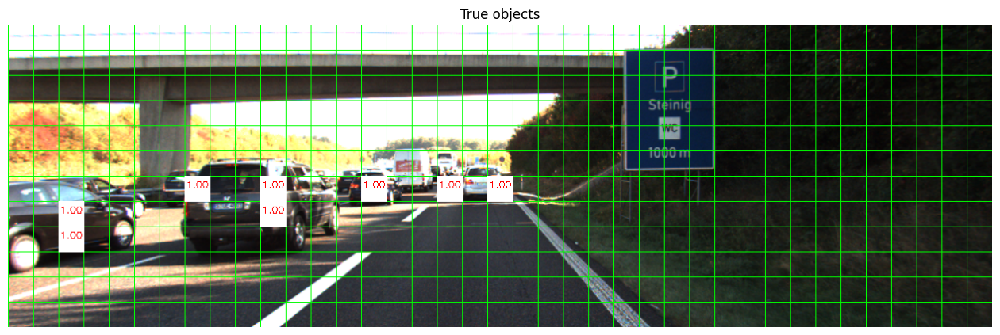

In [46]:
pred_single_image_yolo = yolo_decode(yolo.predict(load_image_resize_norm('000047')[None, ...], verbose=0))[0]

img_yolo = image_grid(load_image_resize('000047'))

image_obj_cell(img_yolo, pred_single_image_yolo['cells'], threshold=0.35) # use the best threshold value
plt.figure(figsize=(16,5))
plt.imshow(img_yolo)
plt.axis('off')
plt.title('Yolo objects')
plt.show()

img_true = image_grid(load_image_resize('000047'))
image_obj_cell(img_true, encode_target('000047')[..., 4])
plt.figure(figsize=(16,5))
plt.imshow(img_true)
plt.axis('off')
plt.title('True objects')
plt.show()

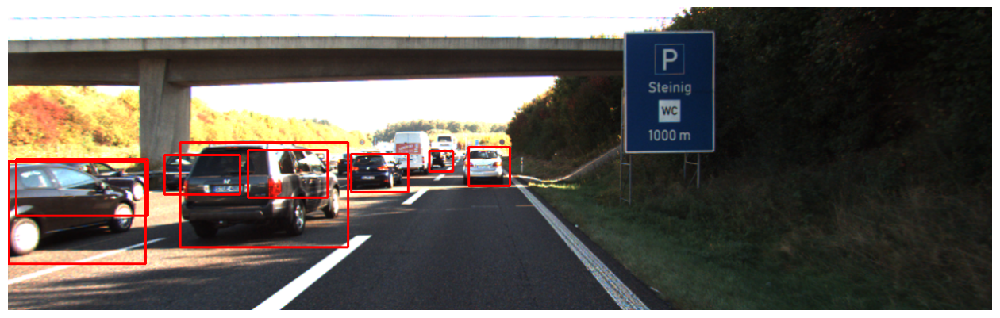

In [49]:
img = load_image_resize('000047')

for i, conf in enumerate(pred_single_image_yolo['confidence']):
    if conf < 0.35: continue
    b = pred_single_image_yolo['boxes'][i]
    cv2.rectangle(img, (int(b[0]), int(b[1])), (int(b[2]), int(b[3])), (255, 0, 0), 2)

plt.figure(figsize=(16,5))
plt.imshow(img)
plt.axis('off')
plt.show()

# Model comparation

Although it is obvious from the image that YOLO, as expected, performed better than my simplified model, I need graphs and numbers for comparison.

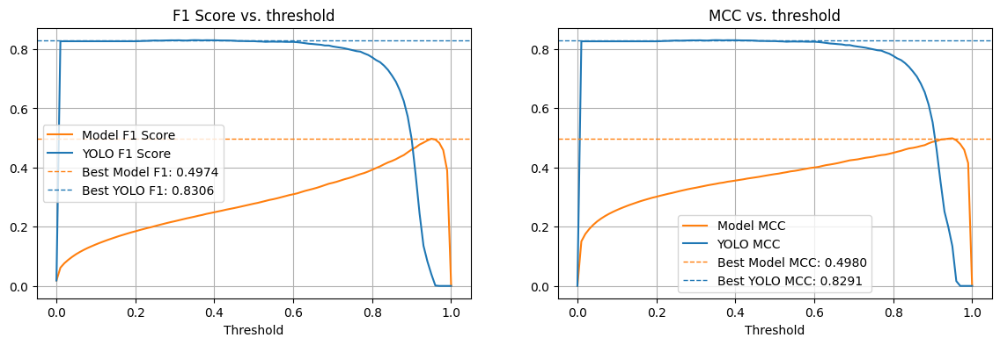

In [50]:
thresholds = np.arange(0.0, 1.01, 0.01)

fig, ax = plt.subplots(1, 2, figsize=(14,4))

f1s, mccs, yolo_f1s, yolo_mccs = [], [], [], []
for thr in thresholds:
    pred_obj = (pred_objects >= thr).astype(int)
    f1s.append(f1_score(true_objects, pred_obj))
    mccs.append(matthews_corrcoef(true_objects, pred_obj))

    yolo_obj = (yolo_objects >= thr).astype(int)
    yolo_f1s.append(f1_score(true_objects, yolo_obj))
    yolo_mccs.append(matthews_corrcoef(true_objects, yolo_obj))
    
best_f1_idx = np.argmax(f1s)
best_f1_threshold = thresholds[best_f1_idx]
best_mcc_idx = np.argmax(mccs)
best_mcc_threshold = thresholds[best_mcc_idx]

yolo_best_f1_idx = np.argmax(yolo_f1s)
yolo_best_mcc_idx = np.argmax(yolo_mccs)

ax[0].plot(thresholds, f1s, color='#ff7f0e', label='Model F1 Score')
ax[0].plot(thresholds, yolo_f1s, color='#1f77b4', label='YOLO F1 Score')
ax[0].axhline(f1s[best_f1_idx], color='#ff7f0e', linestyle='--', lw=1,
            label=f"Best Model F1: {f1s[best_f1_idx]:.4f}")
ax[0].axhline(yolo_f1s[yolo_best_f1_idx], color='#1f77b4', linestyle='--', lw=1,
            label=f"Best YOLO F1: {yolo_f1s[yolo_best_f1_idx]:.4f}")
ax[0].set_xlabel('Threshold')
ax[0].set_title('F1 Score vs. threshold')
ax[0].grid(True)
ax[0].legend()

ax[1].plot(thresholds, mccs, color='#ff7f0e', label='Model MCC')
ax[1].plot(thresholds, yolo_mccs, color='#1f77b4', label='YOLO MCC')
ax[1].axhline(mccs[best_mcc_idx], color='#ff7f0e', linestyle='--', lw=1,
            label=f"Best Model MCC: {mccs[best_mcc_idx]:.4f}")
ax[1].axhline(yolo_mccs[yolo_best_mcc_idx], color='#1f77b4', linestyle='--', lw=1,
            label=f"Best YOLO MCC: {yolo_mccs[yolo_best_mcc_idx]:.4f}")
ax[1].set_xlabel('Threshold')
ax[1].set_title('MCC vs. threshold')
ax[1].grid(True)
ax[1].legend()

plt.show()

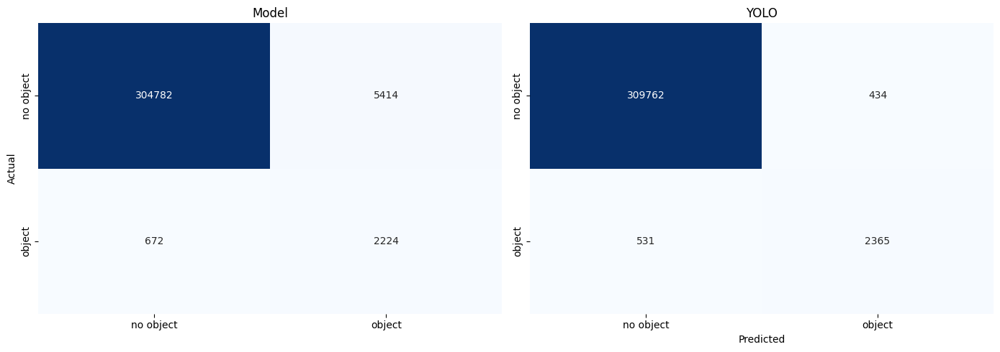

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

yolo_cm = confusion_matrix(true_objects, (yolo_objects > 0.35).astype(int))

labels = ['no object', 'object']

sns.heatmap(cm85, annot=True, fmt='d', cmap='Blues', ax=ax[0], cbar=False,
        xticklabels=labels, yticklabels=labels)
ax[0].set_xlabel('')
ax[0].set_ylabel('Actual')
ax[0].set_title('Model')

sns.heatmap(yolo_cm, annot=True, fmt='d', cmap='Blues', ax=ax[1], cbar=False,
        xticklabels=labels, yticklabels=labels)
ax[1].set_xlabel('Predicted')
ax[1].set_ylabel('')
ax[1].set_title('YOLO')

plt.tight_layout()
plt.show()

The graphs show that my model is more than 1.5 times worse than YOLO in both F1 Score and MCC metrics. Confusion Matrices also clearly demonstrate that, although my model found almost as many actual cars (**True Positive**) as YOLO, it had more than ten times as many False Positives (**Type I Errors**), meaning it found cars where none exist or created multiple bounding boxes for the same car. Using the Non-Maximum Suppression (NMS) algorithm improves the situation, but not significantly, and it also degrades the True Positive metric.

Obviously, the reason is the significantly simpler model architecture, as well as the simplified NMS.

# Conclusion

**My main goal** for this project was to **understand how object detection works** and **build a detection model from scratch**. And I succeeded: my model, despite being significantly simplified compared to the real YOLO, was able to **detect over 75% of cars** in the validation set images. I think that's not bad for a first attempt. And while it's inferior to the real YOLO, I gained a wealth of new knowledge and experience during the project, which I'm sure I'll be able to put to good use again.

A significant portion of my model's false positive errors were due to neighboring grid cells believing they were the center of an object's bounding box and competing for it. Perhaps a more advanced implementation of the Non-Maximum Suppression (NMS) algorithm would have been better able to handle such duplicates.

Among the possible **ways of improvement**, I primarily see **multi-class object detection**, meaning bringing back the remaining classes I excluded for the sake of model simplicity. I also didn't use all the existing model features, such as alpha — the angle at which the car faces the camera. This is crucial for real-world autonomous driving, because if the camera sees a car in front of it and it's moving in the same direction, it's not the same as if it's moving toward you.

When it comes to autonomous driving specifically, simply analyzing camera images and detecting objects is weak. All objects are moving, some obscure others from the camera, and instead of individual images of objects, the autonomous driving system must construct a 3D representation of the surrounding space, including what objects are present, where they are moving, and so on. Each new frame shouldn't be isolated from the previous ones, but rather complement the previous ones, clarifying the position of objects and improving the prediction of their motion. But this is a completely different level of deep learning, and I don't yet understand how to implement it. However, I am very interested in this area; perhaps this task will form the basis of my next project.

### Thank you very much for reviewing my assignment!